<a href="https://colab.research.google.com/github/Nikhil5566/EDA-Repo/blob/main/Medical_cost_predication_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Medical cost predication dataset


# About the dataset

Dataset, comprising 5000 entries, aims to predict annual medical costs based on various individual health and lifestyle factors. It includes both numerical features like age, BMI, daily steps, sleep hours, and stress levels, as well as categorical features such as gender, smoker status, physical activity level, insurance type, and city type. The target variable is annual_medical_cost.

Our initial univariate analysis revealed several distributions. For instance, age spans a wide range, and BMI tends to cluster around the healthy to overweight categories. We observed that the dataset contains more non-smokers and more females than males. Physical activity levels are fairly balanced between 'Low' and 'Medium,' with 'High' being less frequent. Notably, there's a significant portion of missing values in the insurance_type column, which will need attention.

The bivariate analysis, through scatter plots and box plots, started to uncover relationships. For example, a strong positive correlation was noted between annual_medical_cost and previous_year_cost, which is intuitively sensible. Smokers, as expected, tend to have higher medical costs compared to non-smokers. Similar patterns might emerge with conditions like diabetes, hypertension, and heart disease. The relationship between age and medical costs also showed an increasing trend, suggesting that older individuals generally incur higher expenses. Further investigation into the impact of different insurance_type categories and city_type on medical costs would be crucial, especially after handling the missing values in insurance_type.

These preliminary insights lay the groundwork for a more in-depth predictive modeling effort to understand and forecast medical expenses.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d miadul/medical-cost-predication-dataset

# Unziping the downloaded file
!unzip medical-cost-predication-dataset.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/miadul/medical-cost-predication-dataset
License(s): apache-2.0
  0% 0.00/118k [00:00<?, ?B/s]
100% 118k/118k [00:00<00:00, 298MB/s]
Archive:  medical-cost-predication-dataset.zip
  inflating: medical_cost_prediction_dataset.csv  


In [3]:
df = pd.read_csv('medical_cost_prediction_dataset.csv')
df.head(11)

,age,gender,bmi,smoker,diabetes,hypertension,heart_disease,asthma,physical_activity_level,daily_steps,sleep_hours,stress_level,doctor_visits_per_year,hospital_admissions,medication_count,insurance_type,insurance_coverage_pct,city_type,previous_year_cost,annual_medical_cost
0,69,Male,29.4,No,1,0,0,0,Medium,14825,4.4,8,1,0,4,Private,80,Semi-Urban,10885,2645.50
1,32,Female,22.9,No,1,0,0,0,Medium,3620,6.0,7,4,3,0,Government,64,Semi-Urban,18722,10959.70
2,89,Male,25.7,No,0,0,0,0,High,10578,4.5,7,2,0,3,NaN,0,Urban,4196,8409.80
3,78,Male,31.9,Yes,0,1,0,0,Low,6226,8.6,9,6,1,7,Government,70,Urban,11128,7996.62
4,38,Male,27.7,No,0,0,0,0,High,6253,5.7,3,6,0,6,Private,77,Urban,15110,3202.52
5,41,Male,25.7,No,0,0,0,0,Medium,14720,7.7,10,5,2,6,Private,89,Urban,18459,3072.16
6,20,Female,23.0,Yes,0,0,0,0,High,14762,4.4,8,5,0,4,Government,71,Rural,10047,4032.19
7,39,Female,22.8,No,0,0,0,0,Low,9726,4.6,6,3,1,2,Government,66,Rural,13775,5302.81
8,70,Male,21.7,Yes,0,0,0,0,Low,10800,7.4,8,8,0,2,Government,54,Rural,8289,6411.34
9,19,Male,23.3,No,0,0,0,0,Medium,3398,8.2,4,5,1,4,Government,50,Urban,16291,8983.15


In [4]:
df.tail(11)

,age,gender,bmi,smoker,diabetes,hypertension,heart_disease,asthma,physical_activity_level,daily_steps,sleep_hours,stress_level,doctor_visits_per_year,hospital_admissions,medication_count,insurance_type,insurance_coverage_pct,city_type,previous_year_cost,annual_medical_cost
4989,18,Female,25.9,Yes,0,0,0,0,Medium,14412,7.5,7,2,1,1,Private,84,Urban,12856,2719.01
4990,27,Female,21.2,Yes,0,0,0,0,Low,1894,8.5,5,7,1,2,Government,56,Rural,18619,9311.15
4991,89,Male,28.5,No,0,0,0,0,Medium,10198,6.0,2,3,0,5,Government,57,Urban,5305,4225.40
4992,73,Male,25.8,No,0,0,0,0,Low,13474,5.2,5,6,0,0,Government,53,Urban,9859,4038.10
4993,67,Male,23.5,No,0,0,1,0,High,6278,6.7,9,3,1,1,NaN,0,Semi-Urban,5021,18351.30
4994,29,Male,31.5,No,0,0,0,0,Low,1517,4.3,5,3,2,3,Government,63,Urban,12039,8042.58
4995,77,Female,19.7,Yes,0,0,0,0,Low,7825,5.7,3,3,0,4,Government,77,Semi-Urban,17154,3513.76
4996,43,Female,23.9,Yes,0,0,0,0,Medium,9054,8.4,7,4,0,1,NaN,0,Urban,4797,9816.10
4997,58,Female,31.1,No,0,0,0,0,Medium,6299,6.7,3,6,1,2,Private,81,Semi-Urban,16543,3354.62
4998,53,Male,27.6,No,0,0,0,0,Medium,8379,6.2,8,4,0,4,Private,88,Urban,11310,1401.72


In [5]:
df.shape

(5000, 20)

In [6]:
df.columns

Index(['age', 'gender', 'bmi', 'smoker', 'diabetes', 'hypertension',
       'heart_disease', 'asthma', 'physical_activity_level', 'daily_steps',
       'sleep_hours', 'stress_level', 'doctor_visits_per_year',
       'hospital_admissions', 'medication_count', 'insurance_type',
       'insurance_coverage_pct', 'city_type', 'previous_year_cost',
       'annual_medical_cost'],
      dtype='object')

In [7]:
df.dtypes

,0
age,int64
gender,object
bmi,float64
smoker,object
diabetes,int64
hypertension,int64
heart_disease,int64
asthma,int64
physical_activity_level,object
daily_steps,int64


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 20 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   age                      5000 non-null   int64  
 1   gender                   5000 non-null   object 
 2   bmi                      5000 non-null   float64
 3   smoker                   5000 non-null   object 
 4   diabetes                 5000 non-null   int64  
 5   hypertension             5000 non-null   int64  
 6   heart_disease            5000 non-null   int64  
 7   asthma                   5000 non-null   int64  
 8   physical_activity_level  5000 non-null   object 
 9   daily_steps              5000 non-null   int64  
 10  sleep_hours              5000 non-null   float64
 11  stress_level             5000 non-null   int64  
 12  doctor_visits_per_year   5000 non-null   int64  
 13  hospital_admissions      5000 non-null   int64  
 14  medication_count        

In [9]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
age,5000.0,NaN,NaN,NaN,53.299,20.646851,18.0,36.0,53.0,71.0,89.0
gender,5000,2,Female,2519,NaN,NaN,NaN,NaN,NaN,NaN,NaN
bmi,5000.0,NaN,NaN,NaN,25.97082,5.046651,6.4,22.6,25.9,29.4,43.6
smoker,5000,2,No,3779,NaN,NaN,NaN,NaN,NaN,NaN,NaN
diabetes,5000.0,NaN,NaN,NaN,0.2076,0.405629,0.0,0.0,0.0,0.0,1.0
hypertension,5000.0,NaN,NaN,NaN,0.288,0.452876,0.0,0.0,0.0,1.0,1.0
heart_disease,5000.0,NaN,NaN,NaN,0.1422,0.34929,0.0,0.0,0.0,0.0,1.0
asthma,5000.0,NaN,NaN,NaN,0.0964,0.295169,0.0,0.0,0.0,0.0,1.0
physical_activity_level,5000,3,Low,1996,NaN,NaN,NaN,NaN,NaN,NaN,NaN
daily_steps,5000.0,NaN,NaN,NaN,7993.2168,4052.127069,1004.0,4545.0,7989.0,11532.25,14999.0


In [14]:
df.isnull().sum()

,0
age,0
gender,0
bmi,0
smoker,0
diabetes,0
hypertension,0
heart_disease,0
asthma,0
physical_activity_level,0
daily_steps,0


In [15]:
df.duplicated().sum()

np.int64(0)

# Univariate Analysis

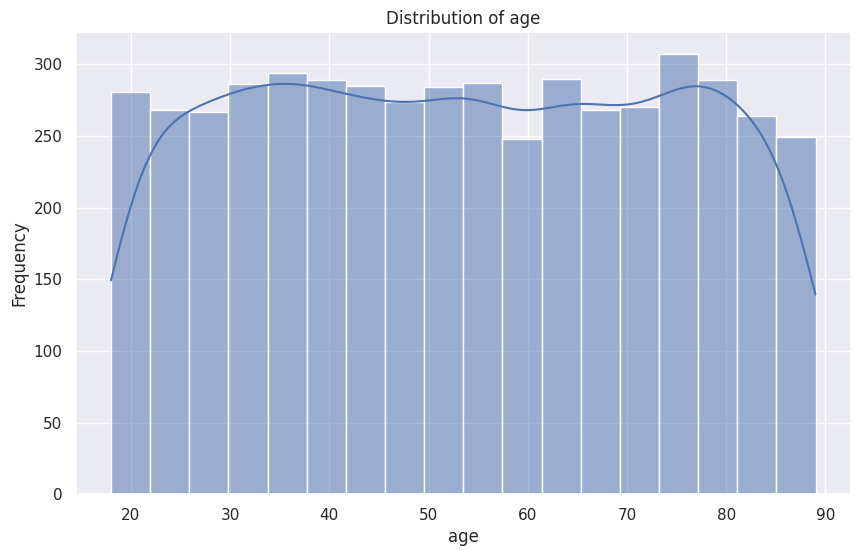

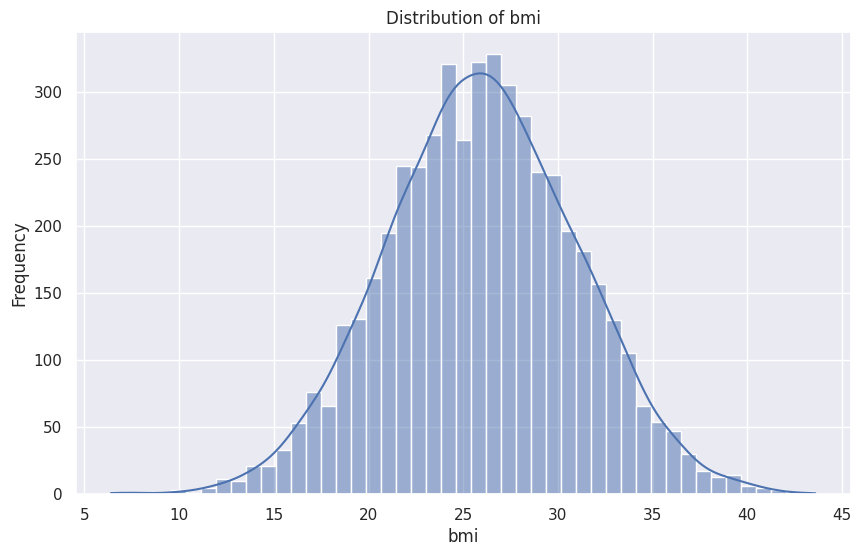

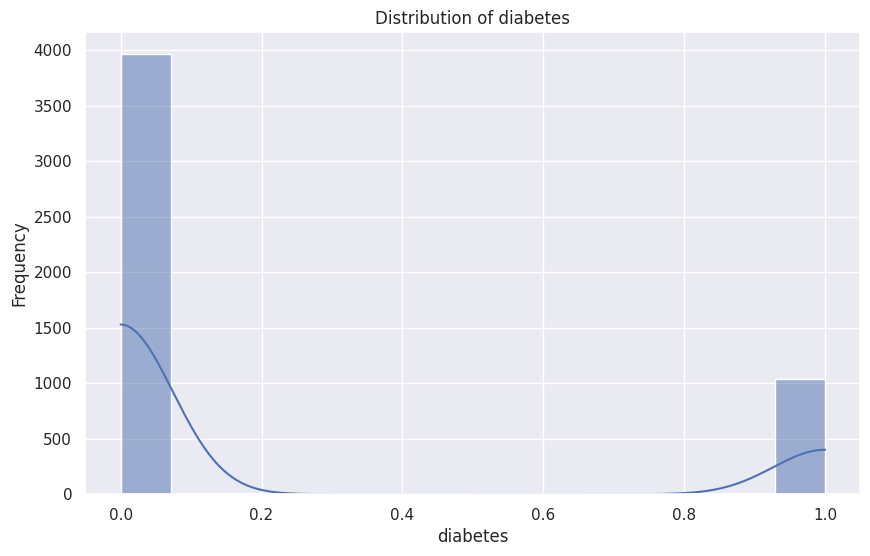

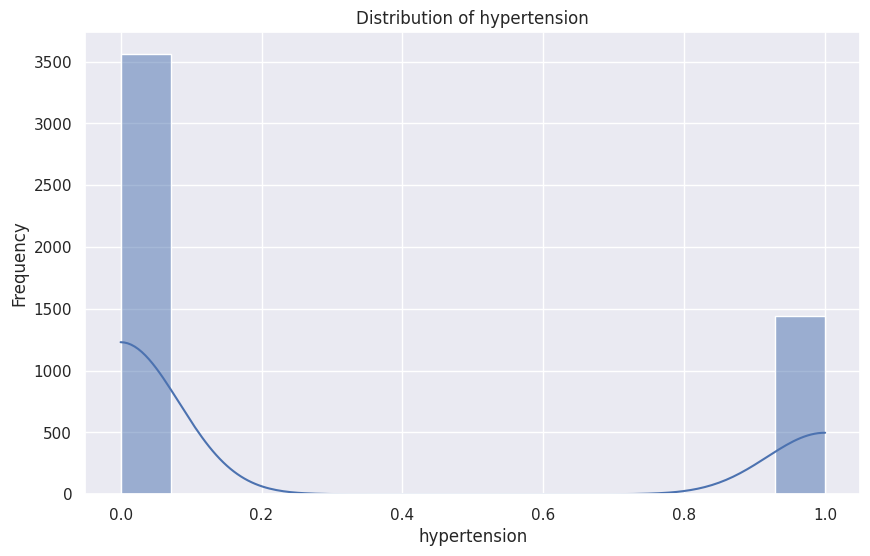

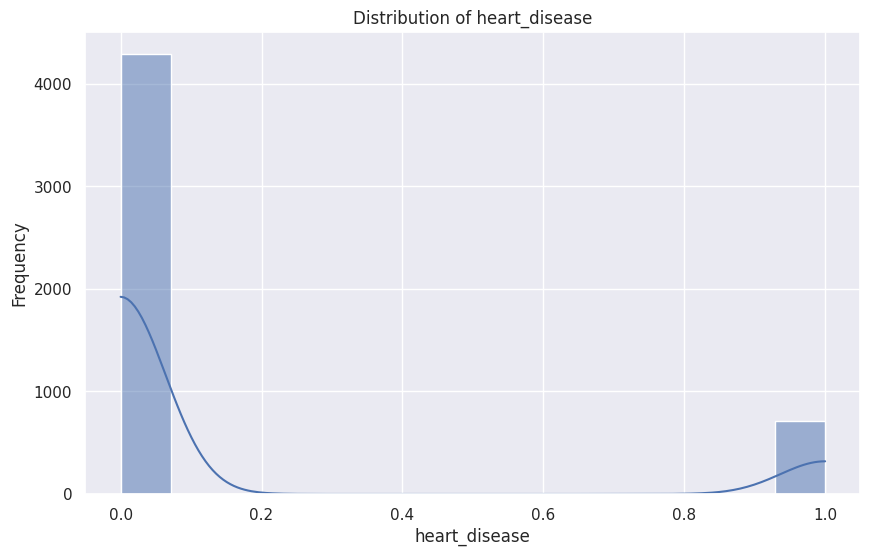

...

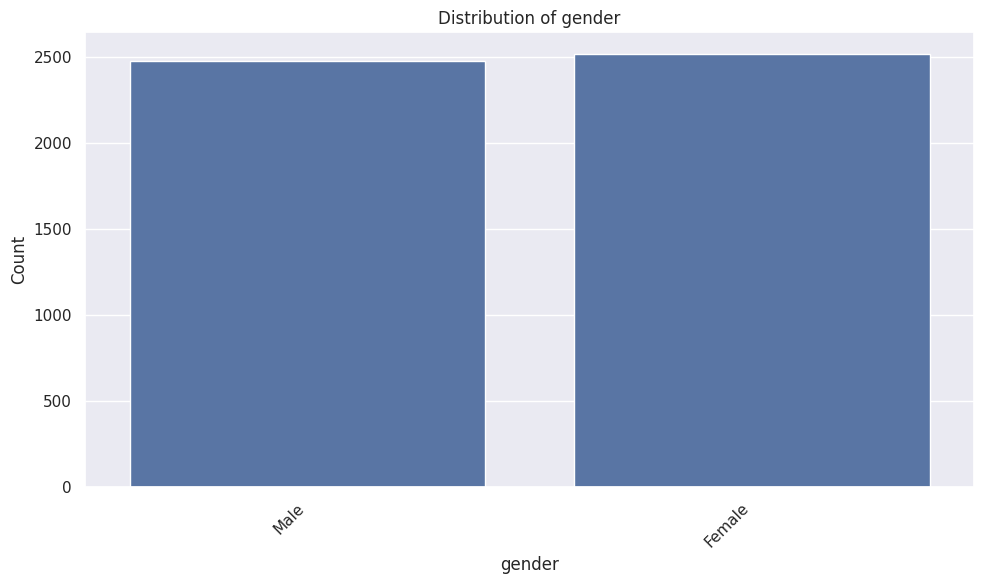

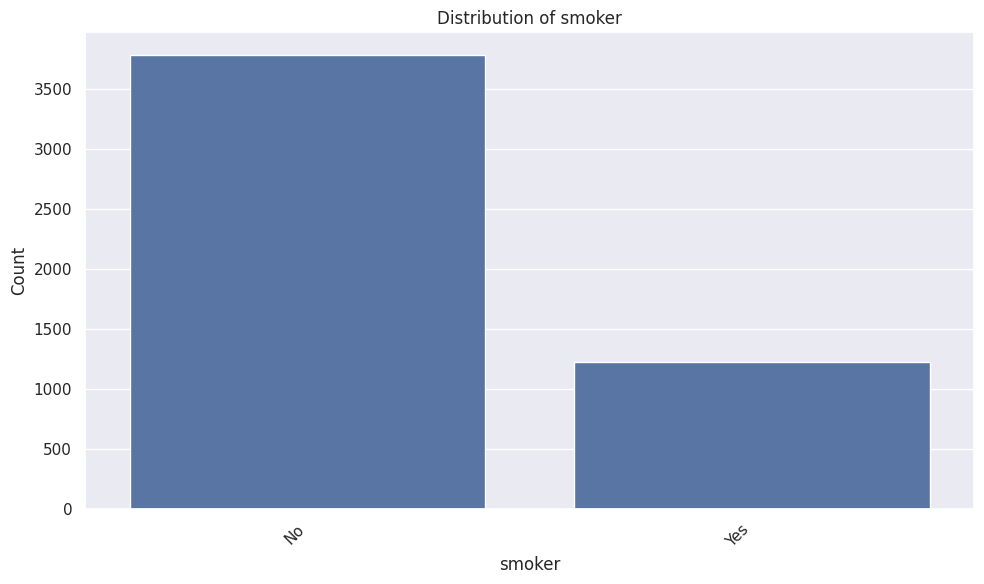

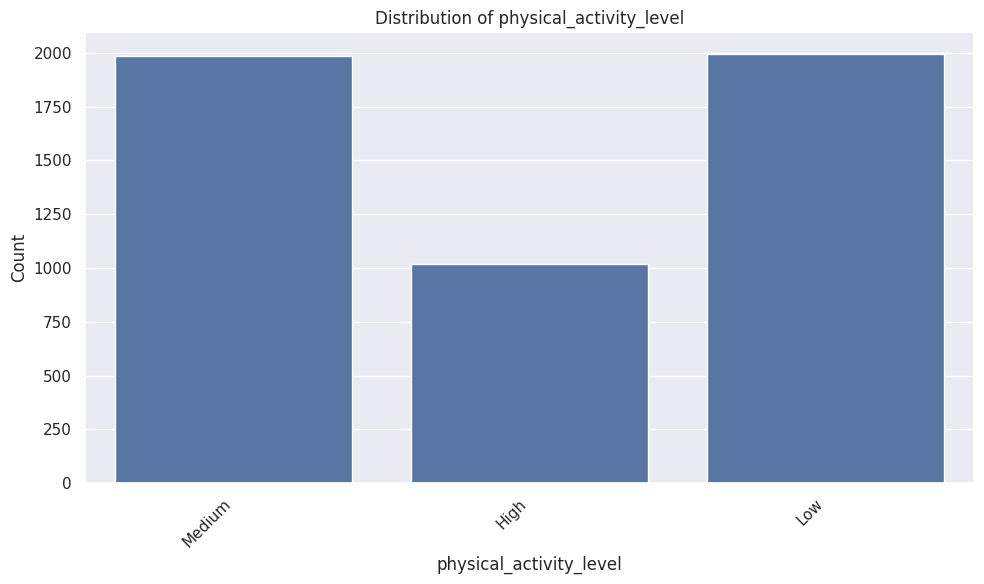

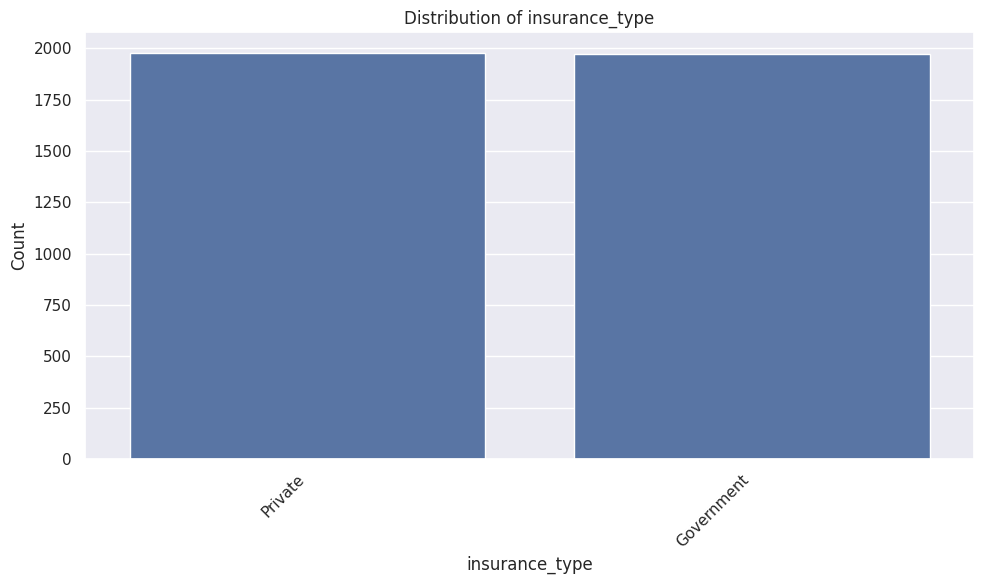

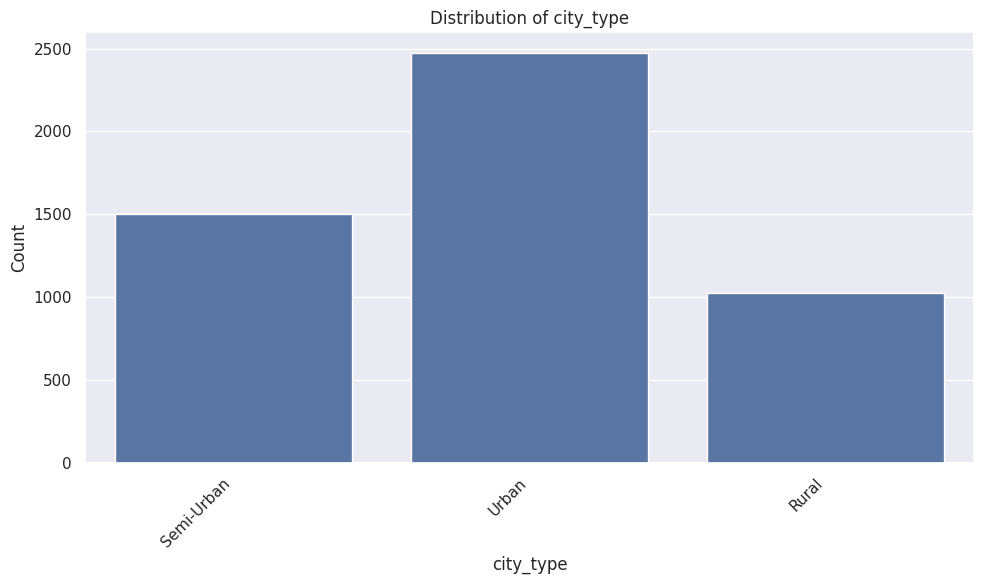

Value counts for gender:
gender
Female    2519
Male      2481
Name: count, dtype: int64

Value counts for smoker:
smoker
No     3779
Yes    1221
Name: count, dtype: int64

Value counts for physical_activity_level:
physical_activity_level
Low       1996
Medium    1986
High      1018
Name: count, dtype: int64

Value counts for insurance_type:
insurance_type
Private       1979
Government    1973
Name: count, dtype: int64

Value counts for city_type:
city_type
Urban         2474
Semi-Urban    1503
Rural         1023
Name: count, dtype: int64



In [10]:
# Getting a list of numerical columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterating through numerical columns and create histograms
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.histplot(data=df, x=col, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

# Getting a list of categorical columns
categorical_cols = df.select_dtypes(include='object').columns.tolist()

# Iterate through categorical columns and create countplots
for col in categorical_cols:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=col)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# We can also use value_counts for a quick look at categorical data distribution
for col in categorical_cols:
    print(f"Value counts for {col}:\n{df[col].value_counts()}\n")

# Bivariate Analysis

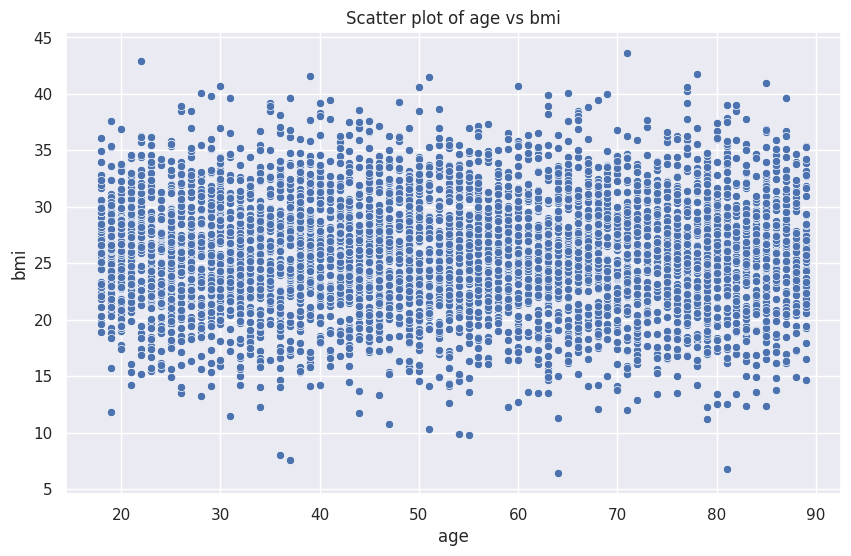

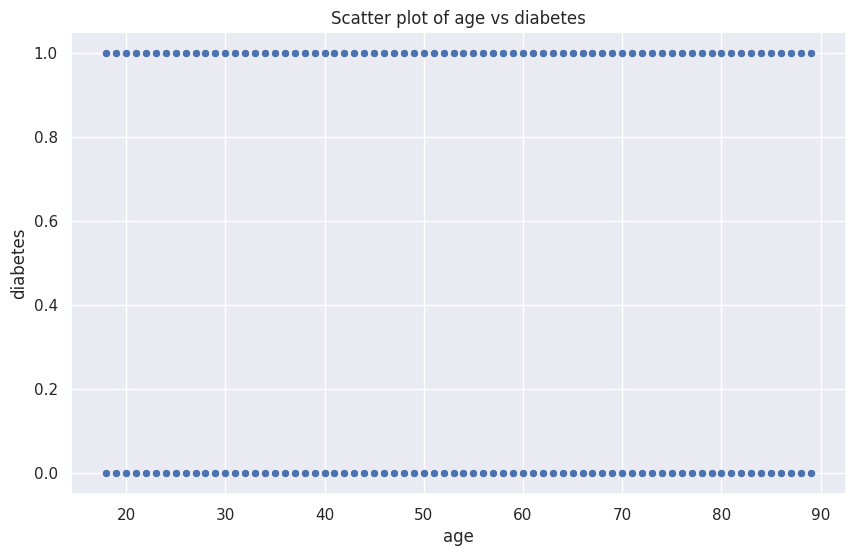

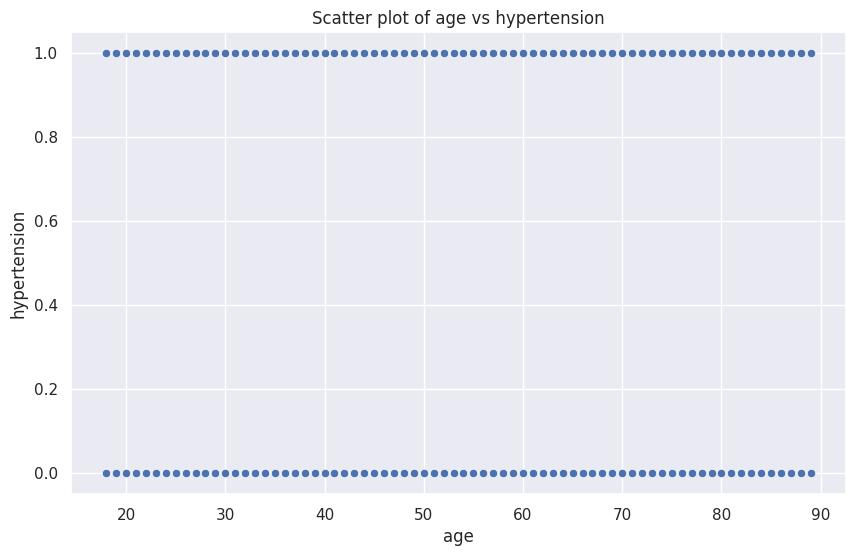

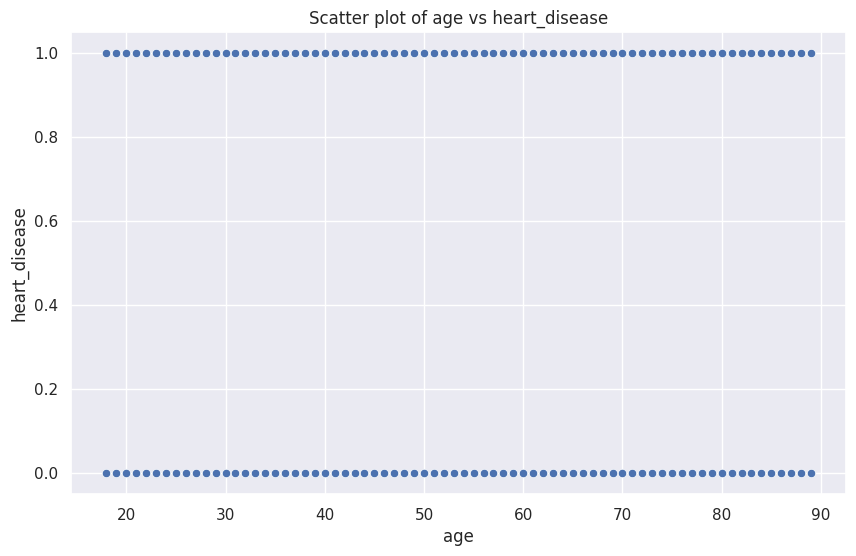

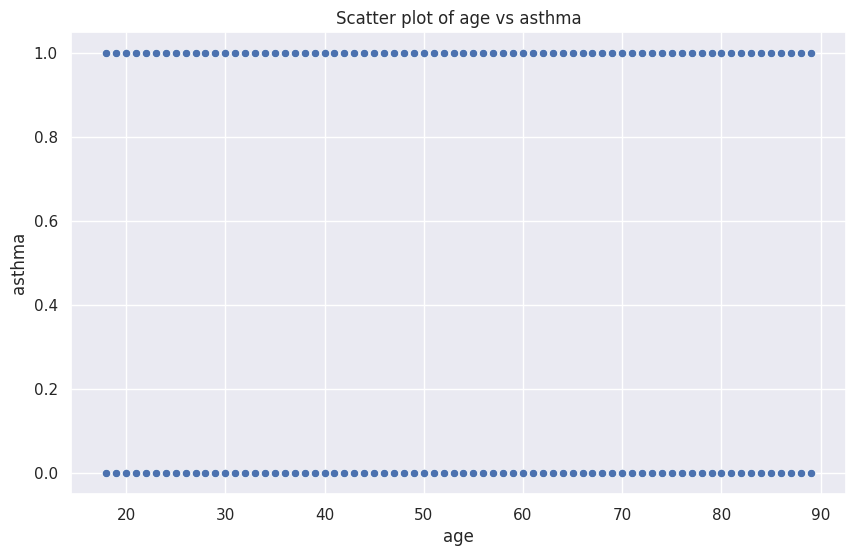

...

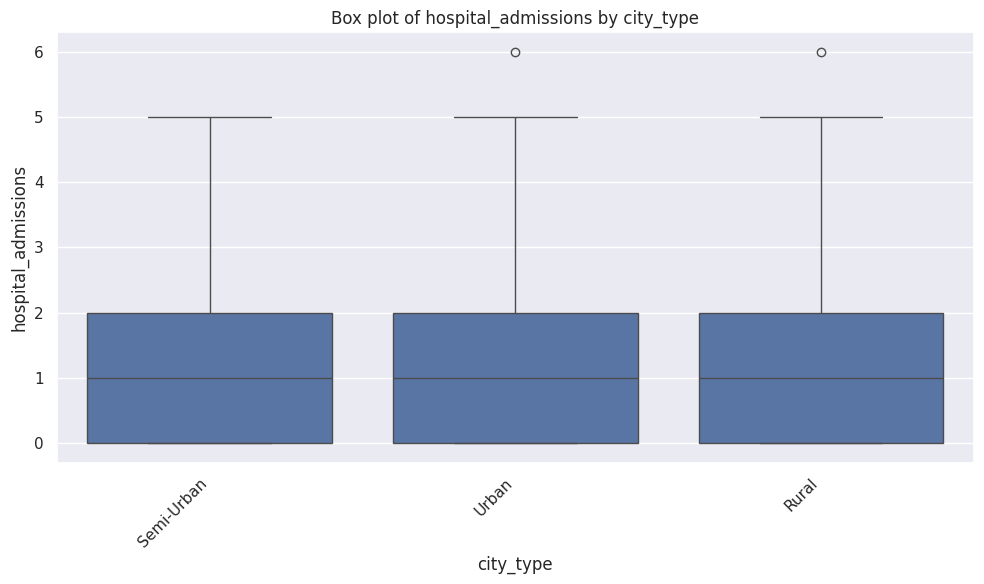

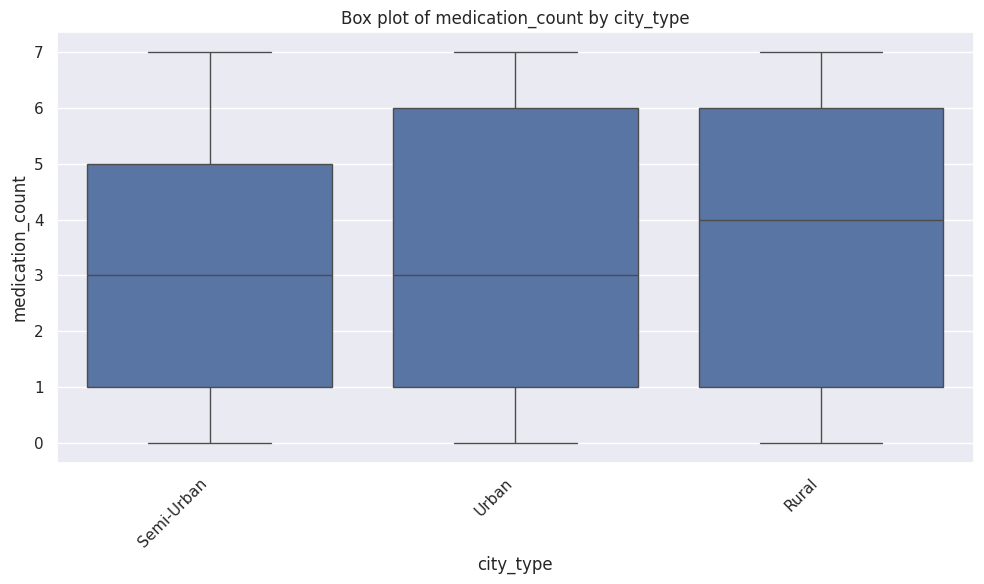

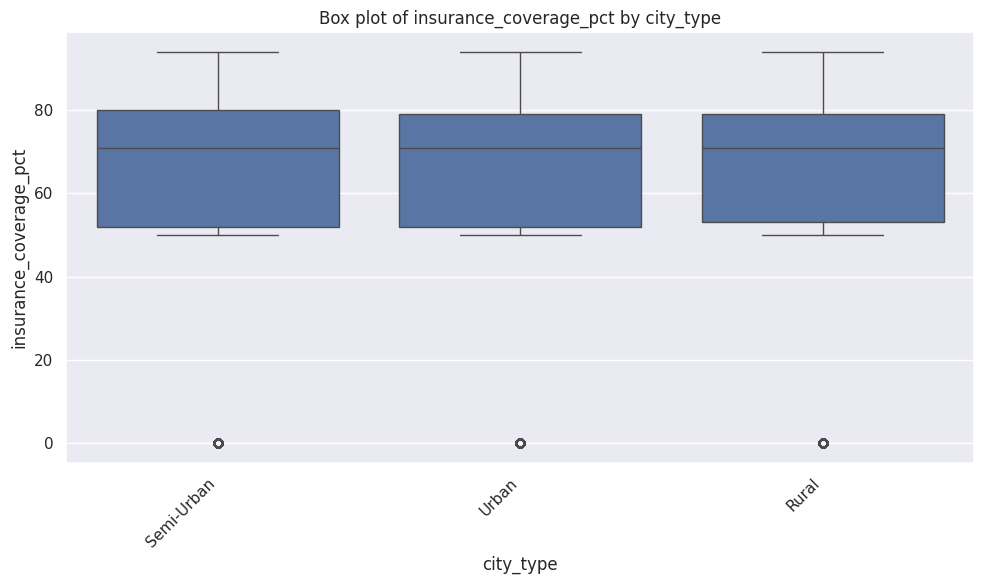

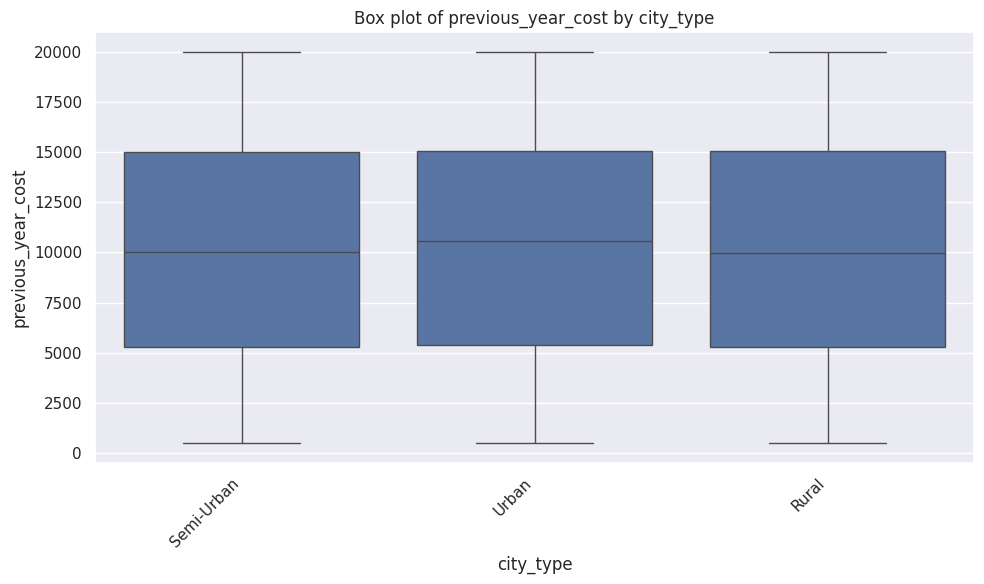

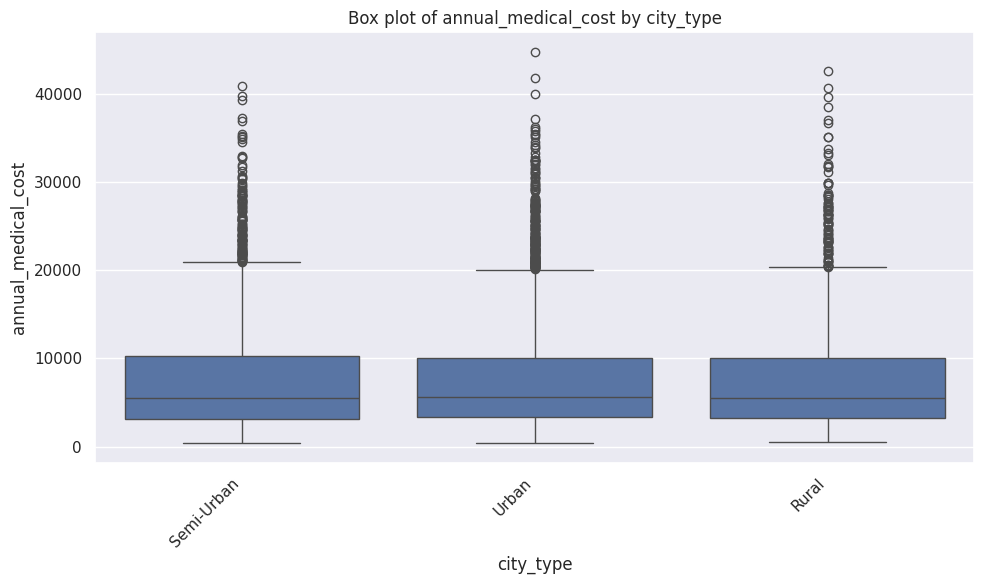

In [11]:
# Numerical-Numerical relationships (Scatter plots)
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterate through pairs of numerical columns and create scatter plots
for i in range(len(numerical_cols)):
    for j in range(i + 1, len(numerical_cols)):
        col1 = numerical_cols[i]
        col2 = numerical_cols[j]
        plt.figure(figsize=(10, 6))
        sns.scatterplot(data=df, x=col1, y=col2)
        plt.title(f'Scatter plot of {col1} vs {col2}')
        plt.xlabel(col1)
        plt.ylabel(col2)
        plt.show()

# Categorical-Numerical relationships (Box plots)
categorical_cols = df.select_dtypes(include='object').columns.tolist()
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterate through categorical and numerical columns and create box plots
for cat_col in categorical_cols:
    for num_col in numerical_cols:
        plt.figure(figsize=(10, 6))
        sns.boxplot(data=df, x=cat_col, y=num_col)
        plt.title(f'Box plot of {num_col} by {cat_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

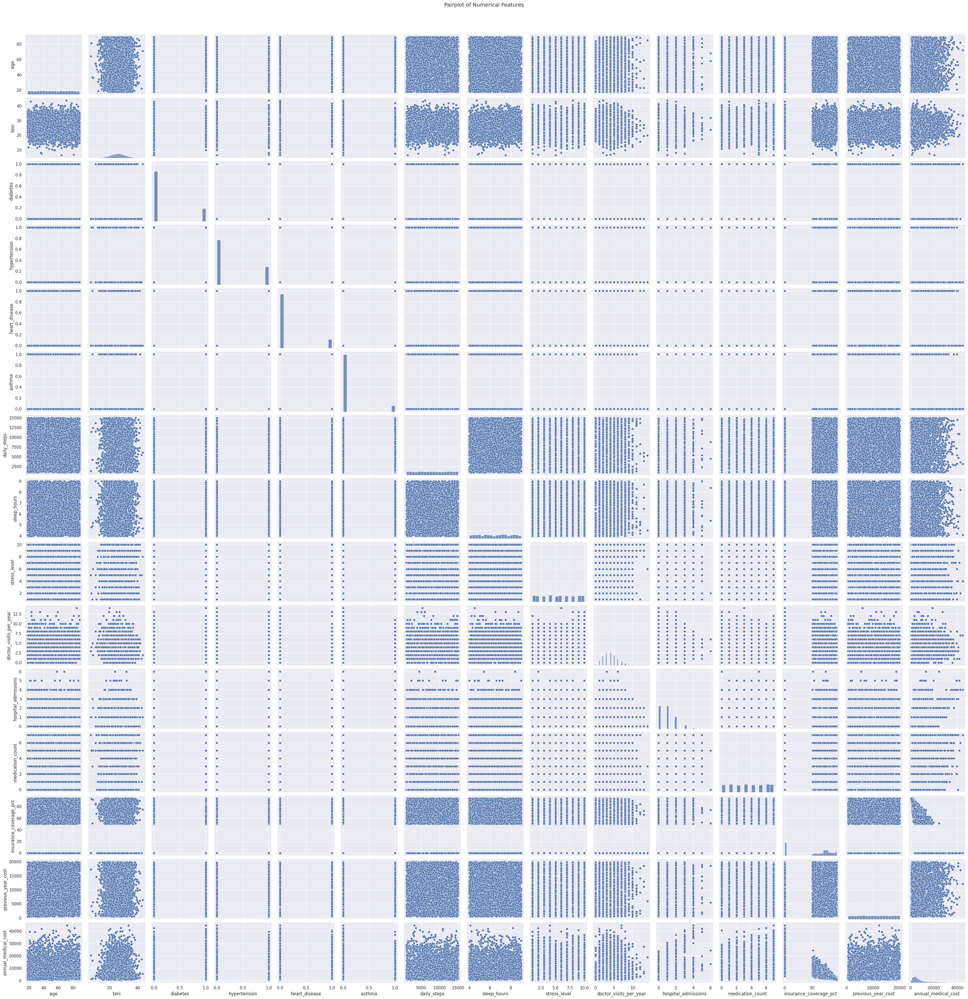

In [12]:
sns.pairplot(df.select_dtypes(include=np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

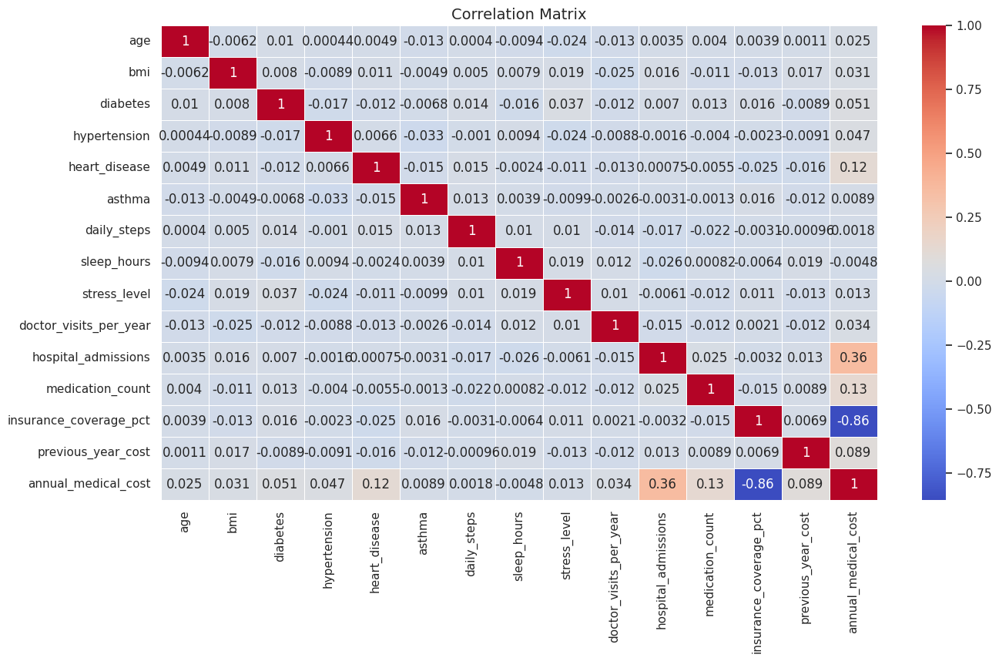

In [13]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Thank You